# Importing the data

In [1]:
#To import the data set
import pandas as pd
breast_cancer = pd.read_csv(("//pepper/homestd/My Documents/Doctorado Bristol/Data science/Assesment/METABRIC_RNA_Mutation.csv"), low_memory=False)

In [2]:
#To visualize the dataset
breast_cancer

,patient_id,age_at_diagnosis,type_of_breast_surgery,cancer_type,cancer_type_detailed,cellularity,chemotherapy,pam50_+_claudin-low_subtype,er_status_measured_by_ihc,er_status,...,srd5a1,srd5a2,srd5a3,st7,star,tnk2,tulp4,ugt2b15,ugt2b17,ugt2b7
0,0,75.65,MASTECTOMY,Breast Cancer,Breast Invasive Ductal Carcinoma,NaN,0,claudin-low,Positve,Positive,...,-1.1877,-0.0194,-1.6345,-0.2142,-0.5698,-1.1741,-1.4779,-0.5954,-0.8847,-0.3354
1,2,43.19,BREAST CONSERVING,Breast Cancer,Breast Invasive Ductal Carcinoma,High,0,LumA,Positve,Positive,...,-0.4412,0.4534,0.4068,0.7634,0.0231,0.9121,-0.9538,-0.2264,0.5398,-0.8920
2,5,48.87,MASTECTOMY,Breast Cancer,Breast Invasive Ductal Carcinoma,High,1,LumB,Positve,Positive,...,-0.5381,0.0668,0.8344,1.7227,0.4024,-3.7172,-1.5538,1.3701,-0.1078,0.3655
3,6,47.68,MASTECTOMY,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,Moderate,1,LumB,Positve,Positive,...,-0.5630,-0.7078,0.8228,0.6819,-0.1948,-2.3286,-0.9924,-0.3154,0.2320,-0.4828
4,8,76.97,MASTECTOMY,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,High,1,LumB,Positve,Positive,...,-0.5845,-0.3544,-1.0150,2.2961,0.1817,-0.1572,0.0427,5.0048,3.8476,1.3223
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1342,6233,70.65,BREAST CONSERVING,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,High,0,LumB,Positve,Positive,...,-0.8087,-2.2898,0.7959,0.5885,-0.5030,-0.2028,0.1612,-0.7089,-0.9014,-0.6310
1343,6237,75.62,MASTECTOMY,Breast Cancer,Breast Invasive Ductal Carcinoma,High,0,Basal,Negative,Negative,...,0.1545,-1.1495,-1.2216,-0.7379,1.8240,0.2230,-0.3529,-0.3898,0.3046,-0.6861
1344,6239,52.84,BREAST CONSERVING,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,High,1,Normal,Positve,Positive,...,-0.0440,0.0102,-0.2031,-0.0867,-1.5902,0.4162,-0.1676,-0.0993,-0.5916,-0.8837
1345,6251,48.59,MASTECTOMY,Breast Cancer,Breast Invasive Ductal Carcinoma,High,1,Basal,Negative,Negative,...,2.1022,0.4776,-0.8773,0.1320,-1.8647,-0.2622,-0.2575,-0.4570,-0.2008,-0.8148


# Linear regression model to determine influence of age in the pacient survival

In [166]:
#to import the linear regression model from scikit learn
from sklearn.linear_model import LinearRegression

model = LinearRegression(fit_intercept=True)

In [167]:
#To define X and Y variables
x = breast_cancer[["age_at_diagnosis"]]
y = breast_cancer["overall_survival_months"]

In [168]:
#to set up the model
model.fit(x, y)

LinearRegression()

In [169]:
x_fit = pd.DataFrame({"x": [0, 100]})

In [170]:
y_pred = model.predict(x_fit)

In [171]:
import matplotlib.pyplot as plt

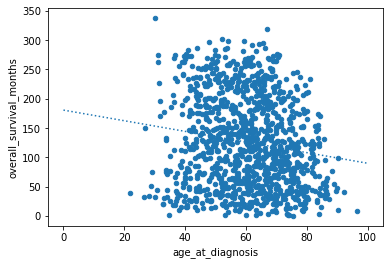

In [172]:
#To plot the linear regression model results
fig, ax = plt.subplots()
breast_cancer.plot.scatter("age_at_diagnosis", "overall_survival_months", ax=ax)
ax.plot(x_fit["x"], y_pred, linestyle=":")

In [10]:
#To print the gradient and the intercept of the model
print(" Model gradient: ", model.coef_[0])
print("Model intercept:", model.intercept_)

 Model gradient:  -0.9005662929638754
Model intercept: 181.54671375088597


# Testing the regression linear model done with patient age

In [11]:
#note: In this case it does not make so much sense to test the regression linear model because clearly there is no linear relation, however with other features or other datasets could be useful to do this test

In [12]:
#to divide the dataset in train and test data
from sklearn.model_selection import train_test_split

train_x, test_x, train_y, test_y = train_test_split(x, y, random_state=42)

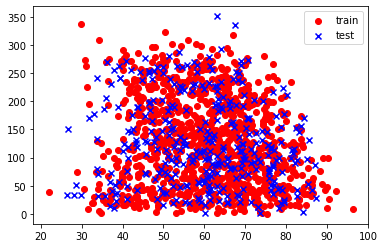

In [13]:
#to plot the results of the model test
import matplotlib.pyplot as plt

fig, ax = plt.subplots()

ax.scatter(train_x, train_y, color="red", marker="o", label="train")
ax.scatter(test_x, test_y, color="blue", marker="x", label="test")
ax.legend()

In [14]:
from sklearn.linear_model import LinearRegression

model = LinearRegression(fit_intercept=True)
model.fit(train_x, train_y)

LinearRegression()

In [15]:
#to calculate the model score
model.score(test_x, test_y)

0.01212091152157857

# Linear regression model to determine influence of tumor size in the pacient survival

In [16]:
#to import the linear regression model from scikit learn
from sklearn.linear_model import LinearRegression

model = LinearRegression(fit_intercept=True)

In [17]:
#To define X and Y variables
x = breast_cancer[["tumor_size"]]
y = breast_cancer["overall_survival_months"]

In [18]:
#to set up the model
model.fit(x, y)

LinearRegression()

In [19]:
x_fit = pd.DataFrame({"x": [0, 180]})

In [20]:
y_pred = model.predict(x_fit)

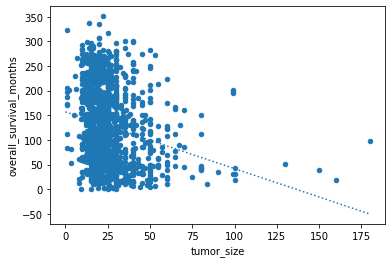

In [21]:
#To plot the linear regression model results
fig, ax = plt.subplots()
breast_cancer.plot.scatter("tumor_size", "overall_survival_months", ax=ax)
ax.plot(x_fit["x"], y_pred, linestyle=":")

In [22]:
#To print the gradient and the intercept of the model
print(" Model gradient: ", model.coef_[0])
print("Model intercept:", model.intercept_)

 Model gradient:  -1.1523209515760204
Model intercept: 156.9143504748292


# Determining the main factors afecting survival

In [23]:
#to be able to see the complete correlation table
pd.set_option("display.max_columns", 520)
pd.set_option("display.max_rows", 520)

In [26]:
#determining the correlation among features
Breast_cancer_corr = breast_cancer.corr()
Breast_cancer_corr

,patient_id,age_at_diagnosis,chemotherapy,neoplasm_histologic_grade,hormone_therapy,lymph_nodes_examined_positive,mutation_count,overall_survival_months,overall_survival,radio_therapy,tumor_size,tumor_stage,brca1,brca2,palb2,pten,tp53,atm,cdh1,chek2,nbn,nf1,stk11,bard1,mlh1,msh2,msh6,pms2,epcam,rad51c,rad51d,rad50,rb1,rbl1,rbl2,ccna1,ccnb1,cdk1,ccne1,cdk2,cdc25a,ccnd1,cdk4,cdk6,ccnd2,cdkn2a,cdkn2b,myc,cdkn1a,cdkn1b,e2f1,e2f2,e2f3,e2f4,e2f5,e2f6,e2f7,e2f8,src,jak1,jak2,stat1,stat2,stat3,stat5a,stat5b,mdm2,tp53bp1,adam10,adam17,aph1a,aph1b,arrdc1,cir1,ctbp1,ctbp2,cul1,dll1,dll3,dll4,dtx1,dtx2,dtx3,dtx4,ep300,fbxw7,hdac1,hdac2,hes1,hes5,heyl,itch,jag1,jag2,kdm5a,lfng,maml1,maml2,maml3,ncor2,ncstn,notch1,notch2,notch3,nrarp,numb,numbl,psen1,psen2,psenen,rbpj,rbpjl,rfng,snw1,spen,hes2,hes4,hes7,hey1,hey2,acvr1,acvr1b,acvr1c,acvr2a,acvr2b,acvrl1,akt1,akt1s1,akt2,apaf1,arl11,atr,aurka,bad,bcl2,bcl2l1,bmp10,bmp15,bmp2,bmp3,bmp4,bmp5,bmp6,bmp7,bmpr1a,bmpr1b,bmpr2,braf,casp10,casp3,casp6,casp7,casp8,casp9,chek1,csf1,csf1r,cxcl8,cxcr1,cxcr2,dab2,diras3,dlec1,dph1,egfr,eif4e,eif4ebp1,eif5a2,erbb2,erbb3,erbb4,fas,fgf1,fgfr1,folr1,folr2,folr3,foxo1,foxo3,gdf11,gdf2,gsk3b,hif1a,hla-g,hras,igf1,igf1r,inha,inhba,inhbc,itgav,itgb3,izumo1r,kdr,kit,kras,map2k1,map2k2,map2k3,map2k4,map2k5,map3k1,map3k3,map3k4,map3k5,mapk1,mapk12,mapk14,mapk3,mapk4,mapk6,mapk7,mapk8,mapk9,mdc1,mlst8,mmp1,mmp10,mmp11,mmp12,mmp13,mmp14,mmp15,mmp16,mmp17,mmp19,mmp2,mmp21,mmp23b,mmp24,mmp25,mmp26,mmp27,mmp28,mmp3,mmp7,mmp9,mtor,nfkb1,nfkb2,opcml,pdgfa,pdgfb,pdgfra,pdgfrb,pdpk1,peg3,pik3ca,pik3r1,pik3r2,plagl1,ptk2,rab25,rad51,raf1,rassf1,rheb,rictor,rps6,rps6ka1,rps6ka2,rps6kb1,rps6kb2,rptor,slc19a1,smad1,smad2,smad3,smad4,smad5,smad6,smad7,smad9,sptbn1,terc,tert,tgfb1,tgfb2,tgfb3,tgfbr1,tgfbr2,tgfbr3,tsc1,tsc2,vegfa,vegfb,wfdc2,wwox,zfyve9,arid1a,arid1b,cbfb,gata3,kmt2c,kmt2d,myh9,ncor1,pde4dip,ptprd,ros1,runx1,tbx3,abcb1,abcb11,abcc1,abcc10,bbc3,bmf,cyp2c8,cyp3a4,fgf2,fn1,map2,map4,mapt,nr1i2,slco1b3,tubb1,tubb4a,tubb4b,twist1,adgra2,afdn,aff2,agmo,agtr2,ahnak,ahnak2,akap9,alk,apc,arid2,arid5b,asxl1,asxl2,bap1,bcas3,birc6,cacna2d3,ccnd3,chd1,clk3,clrn2,col12a1,col22a1,col6a3,ctcf,ctnna1,ctnna3,dnah11,dnah2,dnah5,dtwd2,fam20c,fanca,fancd2,flt3,foxp1,frmd3,gh1,gldc,gpr32,gps2,hdac9,herc2,hist1h2bc,kdm3a,kdm6a,klrg1,l1cam,lama2,lamb3,large1,ldlrap1,lifr,lipi,magea8,map3k10,map3k13,men1,mtap,muc16,myo1a,myo3a,ncoa3,nek1,nf2,npnt,nr2f1,nr3c1,nras,nrg3,nt5e,or6a2,palld,pbrm1,ppp2cb,ppp2r2a,prkacg,prkce,prkcq,prkcz,prkg1,prps2,prr16,ptpn22,ptprm,rasgef1b,rpgr,ryr2,sbno1,setd1a,setd2,setdb1,sf3b1,sgcd,shank2,siah1,sik1,sik2,smarcb1,smarcc1,smarcc2,smarcd1,spaca1,stab2,stmn2,syne1,taf1,taf4b,tbl1xr1,tg,thada,thsd7a,ttyh1,ubr5,ush2a,usp9x,utrn,zfp36l1,ackr3,akr1c1,akr1c2,akr1c3,akr1c4,akt3,ar,bche,cdk8,cdkn2c,cyb5a,cyp11a1,cyp11b2,cyp17a1,cyp19a1,cyp21a2,cyp3a43,cyp3a5,cyp3a7,ddc,hes6,hsd17b1,hsd17b10,hsd17b11,hsd17b12,hsd17b13,hsd17b14,hsd17b2,hsd17b3,hsd17b4,hsd17b6,hsd17b7,hsd17b8,hsd3b1,hsd3b2,hsd3b7,mecom,met,ncoa2,nrip1,pik3r3,prkci,prkd1,ran,rdh5,sdc4,serpini1,shbg,slc29a1,sox9,spry2,srd5a1,srd5a2,srd5a3,st7,star,tnk2,tulp4,ugt2b15,ugt2b17,ugt2b7
patient_id,1.000000,-0.006612,-0.231456,0.041388,-0.243826,-0.141539,0.361140,0.210698,-0.199957,-0.131013,-0.051333,-0.112424,0.083514,0.015634,0.055304,0.109095,0.019279,-0.064965,-0.157584,-0.119632,0.031857,0.415000,-0.015056,0.263086,-0.230882,-0.129919,0.077440,-0.350089,-0.229095,-0.207477,-0.012294,-0.098010,-0.340959,0.096969,-0.033171,0.043950,0.017967,-0.078087,0.138719,0.112130,0.187215,0.172566,-0.095317,-0.013802,-0.009954,-0.027665,-0.038873,-0.303728,-0.364415,-0.159335,0.112025,0.263246,0.184581,0.061418,-0.174702,0.126527,0.161579,0.053600,0.214142,-0.256860,-0.045113,0.221164,0.435449,-0.056463,-0.159972,0.119340,-0.082960,0.112240,-0.218503,-0.132936,-0.155162,-0.061419,0.095126,-0.175637,0.329238,-0.069835,0.141615,0.030454,-0.009035,0.029442,0.118751,0.201402,0.268898,-0.057314,0.081579,0.239179,0.152067,-

In [28]:
#To see only the correlations of the variable of interest
overall_survival_corr = Breast_cancer_corr["overall_survival"]
overall_survival_corr

patient_id                      -0.199957
age_at_diagnosis                -0.293190
chemotherapy                     0.051709
neoplasm_histologic_grade       -0.093518
hormone_therapy                 -0.005750
lymph_nodes_examined_positive   -0.165588
mutation_count                  -0.150963
overall_survival_months          0.400262
overall_survival                 1.000000
radio_therapy                    0.096923
tumor_size                      -0.188945
tumor_stage                     -0.179309
brca1                           -0.055575
brca2                            0.005052
palb2                           -0.046347
pten                             0.018805
tp53                             0.052360
atm                              0.032794
cdh1                             0.022321
chek2                            0.074961
nbn                             -0.003751
nf1                             -0.111407
stk11                           -0.050422
bard1                           -0

In [30]:
#to sort the correlation dataframe and be able to choose more correlated variables for subsequent analysis
sorted_over_corr = overall_survival_corr.sort_values()
print(sorted_over_corr)

age_at_diagnosis                -0.293190
patient_id                      -0.199957
gsk3b                           -0.194792
tumor_size                      -0.188945
tumor_stage                     -0.179309
kmt2c                           -0.172522
lymph_nodes_examined_positive   -0.165588
mutation_count                  -0.150963
tnk2                            -0.145812
tsc2                            -0.145703
afdn                            -0.142619
ncoa3                           -0.141357
pdgfb                           -0.137880
tubb4b                          -0.136728
akt1                            -0.134611
rptor                           -0.134161
map2k2                          -0.131457
map4                            -0.131343
maml1                           -0.130901
rps6kb2                         -0.130779
bap1                            -0.129861
mmp15                           -0.128980
fancd2                          -0.127122
mmp11                           -0

In [84]:
#To visualize the first 12 lines (strong positive correlation with overall survival)
sorted_over_corr_head = sorted_over_corr.head(12)
print(sorted_over_corr_head)

age_at_diagnosis                -0.293190
patient_id                      -0.199957
gsk3b                           -0.194792
tumor_size                      -0.188945
tumor_stage                     -0.179309
kmt2c                           -0.172522
lymph_nodes_examined_positive   -0.165588
mutation_count                  -0.150963
tnk2                            -0.145812
tsc2                            -0.145703
afdn                            -0.142619
ncoa3                           -0.141357
Name: overall_survival, dtype: float64


# Decision tree model to classify individuals features in propensity to live or die

In [125]:
#Load of the requiered packages
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics 

In [126]:
#to prepare the dataset
import pandas as pd
import numpy as np

def clean_dataset(breast_cancer):
    assert isinstance(breast_cancer, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~breast_cancer.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

In [143]:
#to define variables
feature_cols = ['age_at_diagnosis', 'gsk3b', 'tumor_size', 'tumor_stage', 'kmt2c', 'lymph_nodes_examined_positive', 'mutation_count', 'tnk2'] 
x = breast_cancer[feature_cols]
y = breast_cancer['overall_survival']

In [144]:
#split data set 70% training and 30% test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)

In [145]:
#create the decision tree object
clf = DecisionTreeClassifier()

In [146]:
x = x.replace((np.inf, -np.inf, np.nan), 0).reset_index(drop=True)

In [147]:
breast_cancer = breast_cancer.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)

In [148]:
#to train the decision tree
clf = clf.fit(x_train, y_train) 

In [149]:
#to predict the response for test dataset
y_pred = clf.predict(x_test) 

# Evaluation the model by the accuracy estimate

In [150]:
#to estimate the model accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6130952380952381


In [151]:
#to import sklearn packages
import six
import sys
sys.modules['sklearn.externals.six'] = six

In [152]:
#to load requiered packages for visualization of the decision tree
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO
from IPython.display import Image 
import pydotplus

In [153]:
conda install -c conda-forge pydotplus

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\sandovali\Anaconda3

  added / updated specs:
    - pydotplus


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    _anaconda_depends-2021.11  |           py39_0           7 KB
    anaconda-custom            |           py39_1           4 KB
    ca-certificates-2021.10.8  |       h5b45459_0         176 KB  conda-forge
    certifi-2021.10.8          |   py39hcbf5309_1         145 KB  conda-forge
    openssl-1.1.1l             |       h8ffe710_0         5.7 MB  conda-forge
    pandas-1.3.5               |   py39h2e25243_0        11.1 MB  conda-forge
    ------------------------------------------------------------
                                           Total:        17.2 MB

The following NEW packages will be INSTALLED:

  _anaconda_depends  pkgs/main/win-64::_anaconda_depends-2021.11-py39_0
  pand


The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/win-64::anaconda==2021.11=py39_0
  - defaults/win-64::bkcharts==0.2=py39haa95532_0
  - defaults/noarch::dask==2021.10.0=pyhd3eb1b0_0
  - defaults/noarch::seaborn==0.11.2=pyhd3eb1b0_0
  - defaults/win-64::statsmodels==0.12.2=py39h2bbff1b_0
Access is denied.


In [154]:
conda update -n base -c defaults conda

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\sandovali\Anaconda3

  added / updated specs:
    - conda


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    anaconda-project-0.10.2    |     pyhd3eb1b0_0         218 KB
    astropy-5.0                |   py39hc7d831d_0         6.3 MB
    autopep8-1.6.0             |     pyhd3eb1b0_0          42 KB
    bitarray-2.3.5             |   py39h2bbff1b_0         148 KB
    bokeh-2.4.2                |   py39haa95532_0         7.7 MB
    cffi-1.15.0                |   py39h2bbff1b_0         224 KB
    curl-7.80.0                |       h2bbff1b_0         137 KB
    cycler-0.11.0              |     pyhd3eb1b0_0          12 KB
    cython-0.29.25             |   py39h604cdb4_0         1.8 MB
    daal4py-2021.4.0           |   py39h8cb3d55_0         7.9 MB
    dal-2021.4.0               |     haa95532_729   

DEBUG menuinst_win32:__init__(201): Menu: name: 'Anaconda${PY_VER} ${PLATFORM}', prefix: 'C:\Users\sandovali\Anaconda3', env_name: 'None', mode: 'user', used_mode: 'user', root_prefix: 'C:\Users\sandovali\Anaconda3'
DEBUG menuinst_win32:create(328): Shortcut cmd is C:\Users\sandovali\Anaconda3\python.exe, args are ['C:\\Users\\sandovali\\Anaconda3\\cwp.py', 'C:\\Users\\sandovali\\Anaconda3', 'C:\\Users\\sandovali\\Anaconda3\\python.exe', 'C:\\Users\\sandovali\\Anaconda3\\Scripts\\jupyter-notebook-script.py', '"%USERPROFILE%/"']
DEBUG menuinst_win32:__init__(201): Menu: name: 'Anaconda${PY_VER} ${PLATFORM}', prefix: 'C:\Users\sandovali\Anaconda3', env_name: 'None', mode: 'user', used_mode: 'user', root_prefix: 'C:\Users\sandovali\Anaconda3'
DEBUG menuinst_win32:create(328): Shortcut cmd is C:\Users\sandovali\Anaconda3\python.exe, args are ['C:\\Users\\sandovali\\Anaconda3\\cwp.py', 'C:\\Users\\sandovali\\Anaconda3', 'C:\\Users\\sandovali\\Anaconda3\\python.exe', 'C:\\Users\\sandovali\\A

  scipy                                1.7.1-py39hbe87c03_2 --> 1.7.3-py39h0a974cb_0
  snowballstemmer                        2.1.0-pyhd3eb1b0_0 --> 2.2.0-pyhd3eb1b0_0
  soupsieve                              2.2.1-pyhd3eb1b0_0 --> 2.3.1-pyhd3eb1b0_0
  sqlalchemy                          1.4.22-py39h2bbff1b_0 --> 1.4.27-py39h2bbff1b_0
  sqlite                                  3.36.0-h2bbff1b_0 --> 3.37.0-h2bbff1b_0
  toolz                                 0.11.1-pyhd3eb1b0_0 --> 0.11.2-pyhd3eb1b0_0
  traitlets                              5.1.0-pyhd3eb1b0_0 --> 5.1.1-pyhd3eb1b0_0
  watchdog                             2.1.3-py39haa95532_0 --> 2.1.6-py39haa95532_0
  wheel                                 0.37.0-pyhd3eb1b0_1 --> 0.37.1-pyhd3eb1b0_0
  xlsxwriter                             3.0.1-pyhd3eb1b0_0 --> 3.0.2-pyhd3eb1b0_0
  zipp                                   3.6.0-pyhd3eb1b0_0 --> 3.7.0-pyhd3eb1b0_0

The following packages will be SUPERSEDED by a higher-priority channel:

  cer

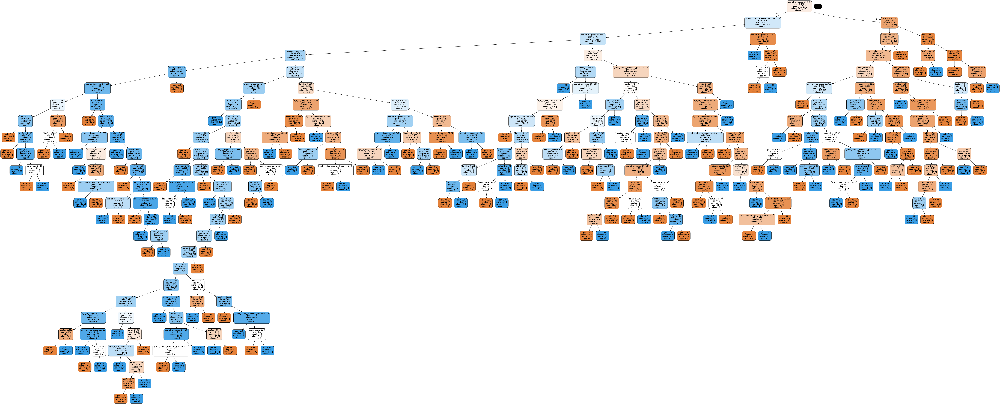

In [155]:
#to obtain the decision tree figure
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('cancer_breast.png')
Image(graph.create_png())

# Optimizing decision tree

In [156]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

In [157]:
# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

In [158]:
#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [159]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6398809523809523


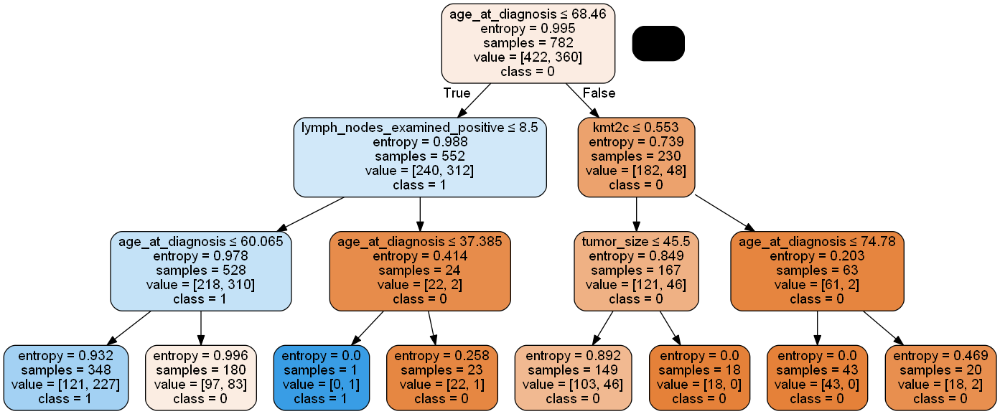

In [160]:
#To obtain the decision tree figure
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decision_tree2.png')
Image(graph.create_png())